#Домашнее задание 1. Реализация модели latent diffusion

##Интро
На семинарах мы познакомились с тем, как обучать диффузионную модель. Эти модели были реализованы через пиксельную диффузию, которую на практике уже никто не использует, потому что это вычислительно сложно обучить. На семинарах было разобрано обучение диффузионной модели. Для обучения вам предлагается обучение модели на датасете `nelorth/oxford-flowers` (https://huggingface.co/datasets/nelorth/oxford-flowers)  

##Цель домашнего задания
Научиться реализовать модель диффузии, модель скрытой диффузии и вносить в нее модификации.

### [5 баллов] Реализация обучения диффузионной модели на новом датасете

В этой части задания вам рекомендуется взять код с семинара и адаптировать его под обучение на новом датасете.

**Ожидаемый результат.** В качестве результатов модели, от вас требуется предоставить визуализации генераций, полученных от вашей модели и код обучения модели.

In [2]:
import time
import torch
from torch import nn, einsum
import torch.nn.functional as F
from torchvision import transforms
from torch.utils.data import DataLoader
from datasets import load_dataset
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import numpy as np
import math
from inspect import isfunction
from functools import partial
from einops import rearrange
from torch.optim.lr_scheduler import CosineAnnealingLR

In [3]:
def exists(x):
    return x is not None

def default(val, d):
    if exists(val):
        return val
    return d() if isfunction(d) else d

def extract(a, t, x_shape):
    batch_size = t.shape[0]
    out = a.gather(-1, t.cpu())
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

def linear_beta_schedule(timesteps):
    beta_start = 0.0001
    beta_end = 0.02
    return torch.linspace(beta_start, beta_end, timesteps)

def cosine_beta_schedule(timesteps, s=0.008):
    steps = timesteps + 1
    x = torch.linspace(0, timesteps, steps)
    alphas_cumprod = torch.cos(((x / timesteps) + s) / (1 + s) * torch.pi * 0.5) ** 2
    alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
    betas = 1 - (alphas_cumprod[1:] / alphas_cumprod[:-1])
    return torch.clip(betas, 0.0001, 0.9999)

In [9]:
timesteps = 300
betas = linear_beta_schedule(timesteps=timesteps)
alphas = 1. - betas
alphas_cumprod = torch.cumprod(alphas, axis=0)
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

In [10]:
def q_sample(x_start, t, noise=None):

    if noise is None:
        noise = torch.randn_like(x_start)

    sqrt_alphas_cumprod_t = extract(sqrt_alphas_cumprod, t, x_start.shape)
    sqrt_one_minus_alphas_cumprod_t = extract(
        sqrt_one_minus_alphas_cumprod, t, x_start.shape
    )

    return sqrt_alphas_cumprod_t * x_start + sqrt_one_minus_alphas_cumprod_t * noise

In [15]:
class Residual(nn.Module):
    def __init__(self, fn):
        super().__init__()
        self.fn = fn

    def forward(self, x, *args, **kwargs):
        return self.fn(x, *args, **kwargs) + x

def Upsample(dim):
    return nn.ConvTranspose2d(dim, dim, 4, 2, 1)

def Downsample(dim):
    return nn.Conv2d(dim, dim, 4, 2, 1)

class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings

class Block(nn.Module):
    def __init__(self, dim, dim_out, groups=8):
        super().__init__()
        self.proj = nn.Conv2d(dim, dim_out, 3, padding=1)
        self.norm = nn.GroupNorm(groups, dim_out)
        self.act = nn.SiLU()

    def forward(self, x, scale_shift=None):
        x = self.proj(x)
        x = self.norm(x)

        if exists(scale_shift):
            scale, shift = scale_shift
            x = x * (scale + 1) + shift

        x = self.act(x)
        return

class ResnetBlock(nn.Module):
    def __init__(self, dim, dim_out, *, time_emb_dim=None, groups=8):
        super().__init__()
        self.mlp = (
            nn.Sequential(nn.SiLU(), nn.Linear(time_emb_dim, dim_out))
            if exists(time_emb_dim)
            else None
        )

        self.block1 = Block(dim, dim_out, groups=groups)
        self.block2 = Block(dim_out, dim_out, groups=groups)
        self.res_conv = nn.Conv2d(dim, dim_out, 1) if dim != dim_out else nn.Identity()

    def forward(self, x, time_emb=None):
        h = self.block1(x)

        if exists(self.mlp) and exists(time_emb):
            time_emb = self.mlp(time_emb)
            h = rearrange(time_emb, "b c -> b c 1 1") + h

        h = self.block2(h)
        return h + self.res_conv(x)

class ConvNextBlock(nn.Module):
    def __init__(self, dim, dim_out, *, time_emb_dim=None, mult=2, norm=True):
        super().__init__()
        self.mlp = (
            nn.Sequential(nn.GELU(), nn.Linear(time_emb_dim, dim))
            if exists(time_emb_dim)
            else None
        )

        self.ds_conv = nn.Conv2d(dim, dim, 7, padding=3, groups=dim)

        self.net = nn.Sequential(
            nn.GroupNorm(1, dim) if norm else nn.Identity(),
            nn.Conv2d(dim, dim_out * mult, 3, padding=1),
            nn.GELU(),
            nn.GroupNorm(1, dim_out * mult),
            nn.Conv2d(dim_out * mult, dim_out, 3, padding=1),
        )

        self.res_conv = nn.Conv2d(dim, dim_out, 1) if dim != dim_out else nn.Identity()

    def forward(self, x, time_emb=None):
        h = self.ds_conv(x)

        if exists(self.mlp) and exists(time_emb):
            assert exists(time_emb), "time embedding must be passed in"
            condition = self.mlp(time_emb)
            h = h + rearrange(condition, "b c -> b c 1 1")

        h = self.net(h)
        return h + self.res_conv(x)

class Attention(nn.Module):
    def __init__(self, dim, heads=4, dim_head=32):
        super().__init__()
        self.scale = dim_head**-0.5
        self.heads = heads
        hidden_dim = dim_head * heads
        self.to_qkv = nn.Conv2d(dim, hidden_dim * 3, 1, bias=False)
        self.to_out = nn.Conv2d(hidden_dim, dim, 1)

    def forward(self, x):
        b, c, h, w = x.shape
        qkv = self.to_qkv(x).chunk(3, dim=1)
        q, k, v = map(
            lambda t: rearrange(t, "b (h c) x y -> b h c (x y)", h=self.heads), qkv
        )
        q = q * self.scale

        sim = einsum("b h d i, b h d j -> b h i j", q, k)
        sim = sim - sim.amax(dim=-1, keepdim=True).detach()
        attn = sim.softmax(dim=-1)

        out = einsum("b h i j, b h d j -> b h i d", attn, v)
        out = rearrange(out, "b h (x y) d -> b (h d) x y", x=h, y=w)
        return self.to_out(out)

class LinearAttention(nn.Module):
    def __init__(self, dim, heads=4, dim_head=32):
        super().__init__()
        self.scale = dim_head**-0.5
        self.heads = heads
        hidden_dim = dim_head * heads
        self.to_qkv = nn.Conv2d(dim, hidden_dim * 3, 1, bias=False)

        self.to_out = nn.Sequential(nn.Conv2d(hidden_dim, dim, 1),
                                     nn.GroupNorm(1, dim))

    def forward(self, x):
        b, c, h, w = x.shape
        qkv = self.to_qkv(x).chunk(3, dim=1)
        q, k, v = map(
            lambda t: rearrange(t, "b (h c) x y -> b h c (x y)", h=self.heads), qkv
        )

        q = q.softmax(dim=-2)
        k = k.softmax(dim=-1)

        q = q * self.scale
        context = torch.einsum("b h d n, b h e n -> b h d e", k, v)

        out = torch.einsum("b h d e, b h d n -> b h e n", context, q)
        out = rearrange(out, "b h c (x y) -> b (h c) x y", h=self.heads, x=h, y=w)
        return self.to_out(out)

class PreNorm(nn.Module):
    def __init__(self, dim, fn):
        super().__init__()
        self.fn = fn
        self.norm = nn.GroupNorm(1, dim)

    def forward(self, x):
        x = self.norm(x)
        return self.fn(x)

In [18]:
class Unet(nn.Module):
    def __init__(
        self,
        dim,
        init_dim=None,
        out_dim=None,
        dim_mults=(1, 2, 4, 8),
        channels=3,
        with_time_emb=True,
        resnet_block_groups=8,
        use_convnext=True,
        convnext_mult=2,
    ):
        super().__init__()

        self.channels = channels

        init_dim = default(init_dim, dim // 3 * 2)
        self.init_conv = nn.Conv2d(channels, init_dim, 7, padding=3)

        dims = [init_dim, *map(lambda m: dim * m, dim_mults)]
        in_out = list(zip(dims[:-1], dims[1:]))

        if use_convnext:
            block_klass = partial(ConvNextBlock, mult=convnext_mult)
        else:
            block_klass = partial(ResnetBlock, groups=resnet_block_groups)

        if with_time_emb:
            time_dim = dim * 4
            self.time_mlp = nn.Sequential(
                SinusoidalPositionEmbeddings(dim),
                nn.Linear(dim, time_dim),
                nn.GELU(),
                nn.Linear(time_dim, time_dim),
            )
        else:
            time_dim = None
            self.time_mlp = None

        self.downs = nn.ModuleList([])
        self.ups = nn.ModuleList([])
        num_resolutions = len(in_out)

        for ind, (dim_in, dim_out) in enumerate(in_out):
            is_last = ind >= (num_resolutions - 1)

            self.downs.append(
                nn.ModuleList(
                    [
                        block_klass(dim_in, dim_out, time_emb_dim=time_dim),
                        block_klass(dim_out, dim_out, time_emb_dim=time_dim),
                        Residual(PreNorm(dim_out, LinearAttention(dim_out))),
                        Downsample(dim_out) if not is_last else nn.Identity(),
                    ]
                )
            )

        mid_dim = dims[-1]
        self.mid_block1 = block_klass(mid_dim, mid_dim, time_emb_dim=time_dim)
        self.mid_attn = Residual(PreNorm(mid_dim, Attention(mid_dim)))
        self.mid_block2 = block_klass(mid_dim, mid_dim, time_emb_dim=time_dim)

        for ind, (dim_in, dim_out) in enumerate(reversed(in_out[1:])):
            is_last = ind >= (num_resolutions - 1)

            self.ups.append(
                nn.ModuleList(
                    [
                        block_klass(dim_out * 2, dim_in, time_emb_dim=time_dim),
                        block_klass(dim_in, dim_in, time_emb_dim=time_dim),
                        Residual(PreNorm(dim_in, LinearAttention(dim_in))),
                        Upsample(dim_in) if not is_last else nn.Identity(),
                    ]
                )
            )

        out_dim = default(out_dim, channels)
        self.final_conv = nn.Sequential(
            block_klass(dim, dim), nn.Conv2d(dim, out_dim, 1)
        )

    def forward(self, x, time):
        x = self.init_conv(x)

        t = self.time_mlp(time) if exists(self.time_mlp) else None

        h = []

        for block1, block2, attn, downsample in self.downs:
            x = block1(x, t)
            x = block2(x, t)
            x = attn(x)
            h.append(x)
            x = downsample(x)

        x = self.mid_block1(x, t)
        x = self.mid_attn(x)
        x = self.mid_block2(x, t)

        for block1, block2, attn, upsample in self.ups:
            x = torch.cat((x, h.pop()), dim=1)
            x = block1(x, t)
            x = block2(x, t)
            x = attn(x)
            x = upsample(x)

        return self.final_conv(x)

In [19]:
def p_losses(denoise_model, x_start, t, noise=None, loss_type="l1"):
    if noise is None:
        noise = torch.randn_like(x_start)

    x_noisy = q_sample(x_start=x_start, t=t, noise=noise)
    predicted_noise = denoise_model(x_noisy, t)

    if loss_type == 'l1':
        loss = F.l1_loss(noise, predicted_noise)
    elif loss_type == 'l2':
        loss = F.mse_loss(noise, predicted_noise)
    elif loss_type == "huber":
        loss = F.smooth_l1_loss(noise, predicted_noise)
    else:
        raise NotImplementedError()

    return loss

@torch.no_grad()
def p_sample(model, x, t, t_index):
    betas_t = extract(betas, t, x.shape)
    sqrt_one_minus_alphas_cumprod_t = extract(
        sqrt_one_minus_alphas_cumprod, t, x.shape
    )
    sqrt_recip_alphas_t = extract(sqrt_recip_alphas, t, x.shape)

    model_mean = sqrt_recip_alphas_t * (
        x - betas_t * model(x, t) / sqrt_one_minus_alphas_cumprod_t
    )

    if t_index == 0:
        return model_mean
    else:
        posterior_variance_t = extract(posterior_variance, t, x.shape)
        noise = torch.randn_like(x)
        return model_mean + torch.sqrt(posterior_variance_t) * noise

@torch.no_grad()
def p_sample_loop(model, shape):
    device = next(model.parameters()).device

    b = shape[0]
    img = torch.randn(shape, device=device)
    imgs = []

    for i in tqdm(reversed(range(0, timesteps)), desc='sampling loop time step', total=timesteps):
        img = p_sample(model, img, torch.full((b,), i, device=device, dtype=torch.long), i)
        imgs.append(img.cpu().numpy())
    return imgs

@torch.no_grad()
def sample(model, image_size, batch_size=16, channels=3):
    return p_sample_loop(model, shape=(batch_size, channels, image_size, image_size))

## Загрузка датасета

In [23]:
image_size = 64
batch_size = 16
channels = 3
dataset = load_dataset("nelorth/oxford-flowers")

transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Lambda(lambda t: (t * 2) - 1)
])

def transform_images(examples):
    images = [transform(image.convert("RGB")) for image in examples["image"]]
    return {"pixel_values": images}

dataset.set_transform(transform_images)

def collate_fn(examples):
    pixel_values = torch.stack([example["pixel_values"] for example in examples])
    return {"pixel_values": pixel_values}

dataloader = DataLoader(
    dataset["train"],
    batch_size=batch_size,
    shuffle=True,
    collate_fn=collate_fn
)

## Обучение модели

In [24]:
device = "cuda" if torch.cuda.is_available() else "cpu"

model = Unet(
    dim=image_size,
    channels=channels,
    dim_mults=(1, 2, 4,)
)
model.to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

epochs = 5

for epoch in range(epochs):
    for step, batch in enumerate(tqdm(dataloader, desc=f"Epoch {epoch+1}/{epochs}")):
        optimizer.zero_grad()

        batch_imgs = batch["pixel_values"].to(device)
        batch_size_curr = batch_imgs.shape[0]
        t = torch.randint(0, timesteps, (batch_size_curr,), device=device).long()
        loss = p_losses(model, batch_imgs, t, loss_type="huber")

        loss.backward()
        optimizer.step()

        if step % 100 == 0:
            print(f"Epoch {epoch+1} | Step {step} | Loss: {loss.item():.4f}")

    torch.save(model.state_dict(), f"diffusion_flowers_epoch_{epoch}.pt")
    print(f"Model saved: diffusion_flowers_epoch_{epoch}.pt")

Epoch 1/5:   0%|          | 0/449 [00:00<?, ?it/s]

Epoch 1 | Step 0 | Loss: 0.4907
Epoch 1 | Step 100 | Loss: 0.2053
Epoch 1 | Step 200 | Loss: 0.1353
Epoch 1 | Step 300 | Loss: 0.0994
Epoch 1 | Step 400 | Loss: 0.0732
Model saved: diffusion_flowers_epoch_0.pt


Epoch 2/5:   0%|          | 0/449 [00:00<?, ?it/s]

Epoch 2 | Step 0 | Loss: 0.0871
Epoch 2 | Step 100 | Loss: 0.0643
Epoch 2 | Step 200 | Loss: 0.1056
Epoch 2 | Step 300 | Loss: 0.0885
Epoch 2 | Step 400 | Loss: 0.0673
Model saved: diffusion_flowers_epoch_1.pt


Epoch 3/5:   0%|          | 0/449 [00:00<?, ?it/s]

Epoch 3 | Step 0 | Loss: 0.0672
Epoch 3 | Step 100 | Loss: 0.0764
Epoch 3 | Step 200 | Loss: 0.0379
Epoch 3 | Step 300 | Loss: 0.0498
Epoch 3 | Step 400 | Loss: 0.0355
Model saved: diffusion_flowers_epoch_2.pt


Epoch 4/5:   0%|          | 0/449 [00:00<?, ?it/s]

Epoch 4 | Step 0 | Loss: 0.0880
Epoch 4 | Step 100 | Loss: 0.0480
Epoch 4 | Step 200 | Loss: 0.0640
Epoch 4 | Step 300 | Loss: 0.0303
Epoch 4 | Step 400 | Loss: 0.0804
Model saved: diffusion_flowers_epoch_3.pt


Epoch 5/5:   0%|          | 0/449 [00:00<?, ?it/s]

Epoch 5 | Step 0 | Loss: 0.0411
Epoch 5 | Step 100 | Loss: 0.0207
Epoch 5 | Step 200 | Loss: 0.0681
Epoch 5 | Step 300 | Loss: 0.0266
Epoch 5 | Step 400 | Loss: 0.0550
Model saved: diffusion_flowers_epoch_4.pt


Ваши визуализации

Generating samples...


sampling loop time step:   0%|          | 0/300 [00:00<?, ?it/s]

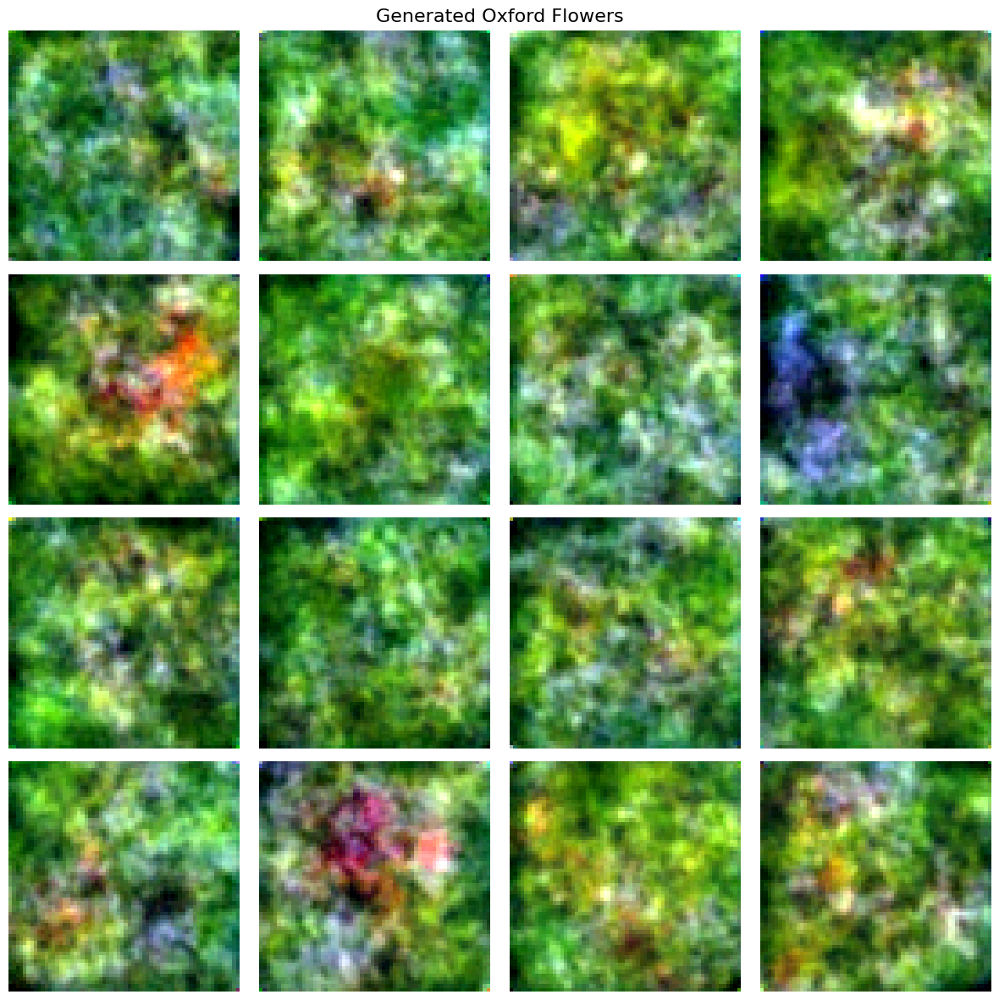

In [25]:
samples = sample(model, image_size=image_size, batch_size=16, channels=3)

fig, axes = plt.subplots(4, 4, figsize=(12, 12))
for i, ax in enumerate(axes.flat):
    img = samples[-1][i]
    img = (img + 1) / 2
    img = img.transpose(1, 2, 0)
    img = np.clip(img, 0, 1)
    ax.imshow(img)
    ax.axis('off')
plt.suptitle('Generated Oxford Flowers', fontsize=16)
plt.tight_layout()
plt.savefig('generated_oxford_flowers.png', dpi=150)
plt.show()

### [3 балла] Реализация обучения модели latent diffusion

Напоминание про реализацию модели: [Latent Diffusion](https://nn.labml.ai/diffusion/stable_diffusion/latent_diffusion.html)

Для того чтобы из кода обучения Diffusion получить обучение Latent Diffusion, вам нужно добавить VQ-VAE и обрабатывать изображения с помощью `vae.encode`. Далее полученные latent, подаются в стандартный пайплайн обучения. Учтите, что latent имеет меньшую размерность и вам может понадобиться уменьшить число слоев в архитектуре UNet.

В качестве модели VQ-VAE вы можете воспользоваться предобученным VQ-VAE от Stable diffusion.

**Ожидаемый результат.** В качестве результатов модели от вас требуется предоставить визуализации генераций, полученных от вашей модели, и код обучения модели.

In [27]:
from diffusers import AutoencoderKL

vae = AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae")

device = "cuda" if torch.cuda.is_available() else "cpu"
vae = vae.to(device)
vae.eval()

# Замораживаем VAE - не обучаем его!
for param in vae.parameters():
    param.requires_grad = False

In [28]:
image_size = 256
batch_size = 8
channels = 3
latent_channels = 4
latent_size = 32

In [29]:
transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])

In [32]:
model = Unet(
    dim=32,
    channels=4,
    dim_mults=(1, 2, 4),
)
model = model.to(device)

In [38]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")
print(f"Model device: {next(model.parameters()).device}")
print(f"VAE device: {next(vae.parameters()).device}")

epochs = 30
learning_rate = 1e-4
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate, weight_decay=0.01)
scheduler = CosineAnnealingLR(optimizer, T_max=epochs, eta_min=1e-6)

loss_history = []
epoch_losses = []
learning_rates = []

@torch.no_grad()
def quick_generate(model, vae, n_images=4):
    """Быстрая генерация изображений для мониторинга"""
    device = next(model.parameters()).device
    shape = (n_images, 4, 32, 32)
    x = torch.randn(shape, device=device)

    for i in range(0, timesteps, 10):
        t = torch.full((n_images,), i, device=device, dtype=torch.long)
        predicted_noise = model(x, t)

        betas_t = extract(betas, t, x.shape)
        sqrt_one_minus_alphas_cumprod_t = extract(sqrt_one_minus_alphas_cumprod, t, x.shape)
        sqrt_recip_alphas_t = extract(sqrt_recip_alphas, t, x.shape)

        x = sqrt_recip_alphas_t * (x - betas_t * predicted_noise / sqrt_one_minus_alphas_cumprod_t)

        if i > 0:
            noise = torch.randn_like(x)
            posterior_variance_t = extract(posterior_variance, t, x.shape)
            x = x + torch.sqrt(posterior_variance_t) * noise

    images = vae.decode(x / 0.18215).sample.cpu()
    return images

best_loss = float('inf')

for epoch in range(epochs):
    model.train()
    epoch_loss = 0
    num_batches = 0
    pbar = tqdm(dataloader, desc=f"Epoch {epoch+1}/{epochs}")

    for step, batch in enumerate(pbar):
        optimizer.zero_grad()
        batch_imgs = batch["pixel_values"].to(device)
        batch_size_curr = batch_imgs.shape[0]

        with torch.no_grad():
            latent_dist = vae.encode(batch_imgs).latent_dist
            latents = latent_dist.sample() * 0.18215

        t = torch.randint(0, timesteps, (batch_size_curr,), device=device).long()
        loss = p_losses(model, latents, t, loss_type="l2")

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

        optimizer.step()

        loss_value = loss.item()
        loss_history.append(loss_value)
        epoch_loss += loss_value
        num_batches += 1

        pbar.set_postfix({'loss': f'{loss_value:.4f}'})

    avg_epoch_loss = epoch_loss / num_batches
    epoch_losses.append(avg_epoch_loss)

    current_lr = optimizer.param_groups[0]['lr']
    learning_rates.append(current_lr)

    scheduler.step()

    print(f"\n Epoch {epoch+1}/{epochs} completed")
    print(f"   Average Loss: {avg_epoch_loss:.4f}")
    print(f"   Learning Rate: {current_lr:.6f}")

    if avg_epoch_loss < best_loss:
        best_loss = avg_epoch_loss
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': avg_epoch_loss,
        }, 'latent_diffusion_best.pt')
        print(f"Best model saved! (loss: {best_loss:.4f})")

    if (epoch + 1) % 5 == 0:
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': avg_epoch_loss,
            'loss_history': loss_history,
            'epoch_losses': epoch_losses,
        }, f'checkpoint_epoch_{epoch+1}.pt')
        print(f"Checkpoint saved: checkpoint_epoch_{epoch+1}.pt")

    if (epoch + 1) % 5 == 0:
        print(f"Generating test samples...")
        model.eval()

        test_images = quick_generate(model, vae, n_images=8)

        fig, axes = plt.subplots(2, 4, figsize=(16, 8))
        for i, ax in enumerate(axes.flat):
            img = ((test_images[i] + 1) / 2).permute(1, 2, 0).numpy()
            ax.imshow(np.clip(img, 0, 1))
            ax.axis('off')
        plt.suptitle(f'Generated Samples - Epoch {epoch+1}', fontsize=16)
        plt.tight_layout()
        plt.savefig(f'samples_epoch_{epoch+1}.png', dpi=100, bbox_inches='tight')
        plt.close()
        print(f"Samples saved: samples_epoch_{epoch+1}.png")

print(f"Best Loss: {best_loss:.4f}")

Using device: cuda
Model device: cuda:0
VAE device: cuda:0


Epoch 1/30:   0%|          | 0/449 [00:00<?, ?it/s]


 Epoch 1/30 completed
   Average Loss: 0.4637
   Learning Rate: 0.000100
Best model saved! (loss: 0.4637)


Epoch 2/30:   0%|          | 0/449 [00:00<?, ?it/s]


 Epoch 2/30 completed
   Average Loss: 0.4263
   Learning Rate: 0.000100
Best model saved! (loss: 0.4263)


Epoch 3/30:   0%|          | 0/449 [00:00<?, ?it/s]


 Epoch 3/30 completed
   Average Loss: 0.4097
   Learning Rate: 0.000099
Best model saved! (loss: 0.4097)


Epoch 4/30:   0%|          | 0/449 [00:00<?, ?it/s]


 Epoch 4/30 completed
   Average Loss: 0.3871
   Learning Rate: 0.000098
Best model saved! (loss: 0.3871)


Epoch 5/30:   0%|          | 0/449 [00:00<?, ?it/s]


 Epoch 5/30 completed
   Average Loss: 0.3771
   Learning Rate: 0.000096
Best model saved! (loss: 0.3771)
Checkpoint saved: checkpoint_epoch_5.pt
Generating test samples...
Samples saved: samples_epoch_5.png


Epoch 6/30:   0%|          | 0/449 [00:00<?, ?it/s]


 Epoch 6/30 completed
   Average Loss: 0.3749
   Learning Rate: 0.000093
Best model saved! (loss: 0.3749)


Epoch 7/30:   0%|          | 0/449 [00:00<?, ?it/s]


 Epoch 7/30 completed
   Average Loss: 0.3718
   Learning Rate: 0.000091
Best model saved! (loss: 0.3718)


Epoch 8/30:   0%|          | 0/449 [00:00<?, ?it/s]


 Epoch 8/30 completed
   Average Loss: 0.3653
   Learning Rate: 0.000087
Best model saved! (loss: 0.3653)


Epoch 9/30:   0%|          | 0/449 [00:00<?, ?it/s]


 Epoch 9/30 completed
   Average Loss: 0.3649
   Learning Rate: 0.000084
Best model saved! (loss: 0.3649)


Epoch 10/30:   0%|          | 0/449 [00:00<?, ?it/s]


 Epoch 10/30 completed
   Average Loss: 0.3567
   Learning Rate: 0.000080
Best model saved! (loss: 0.3567)
Checkpoint saved: checkpoint_epoch_10.pt
Generating test samples...
Samples saved: samples_epoch_10.png


Epoch 11/30:   0%|          | 0/449 [00:00<?, ?it/s]


 Epoch 11/30 completed
   Average Loss: 0.3575
   Learning Rate: 0.000075


Epoch 12/30:   0%|          | 0/449 [00:00<?, ?it/s]


 Epoch 12/30 completed
   Average Loss: 0.3565
   Learning Rate: 0.000071
Best model saved! (loss: 0.3565)


Epoch 13/30:   0%|          | 0/449 [00:00<?, ?it/s]


 Epoch 13/30 completed
   Average Loss: 0.3487
   Learning Rate: 0.000066
Best model saved! (loss: 0.3487)


Epoch 14/30:   0%|          | 0/449 [00:00<?, ?it/s]


 Epoch 14/30 completed
   Average Loss: 0.3621
   Learning Rate: 0.000061


Epoch 15/30:   0%|          | 0/449 [00:00<?, ?it/s]


 Epoch 15/30 completed
   Average Loss: 0.3571
   Learning Rate: 0.000056
Checkpoint saved: checkpoint_epoch_15.pt
Generating test samples...
Samples saved: samples_epoch_15.png


Epoch 16/30:   0%|          | 0/449 [00:00<?, ?it/s]


 Epoch 16/30 completed
   Average Loss: 0.3486
   Learning Rate: 0.000051
Best model saved! (loss: 0.3486)


Epoch 17/30:   0%|          | 0/449 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [39]:

device = "cuda" if torch.cuda.is_available() else "cpu"
checkpoint_path = 'checkpoint_epoch_15.pt'
checkpoint = torch.load(checkpoint_path, map_location=device)

print("\nCheckpoint contents:")
for key in checkpoint.keys():
    print(f"  - {key}")

model.load_state_dict(checkpoint['model_state_dict'])
model = model.to(device)
model.eval()

print(f"\n Model loaded from epoch {checkpoint['epoch'] + 1}")
print(f"   Training loss was: {checkpoint['loss']:.4f}")


Checkpoint contents:
  - epoch
  - model_state_dict
  - optimizer_state_dict
  - loss
  - loss_history
  - epoch_losses

 Model loaded from epoch 15
   Training loss was: 0.3571


Sampling:   0%|          | 0/300 [00:00<?, ?it/s]

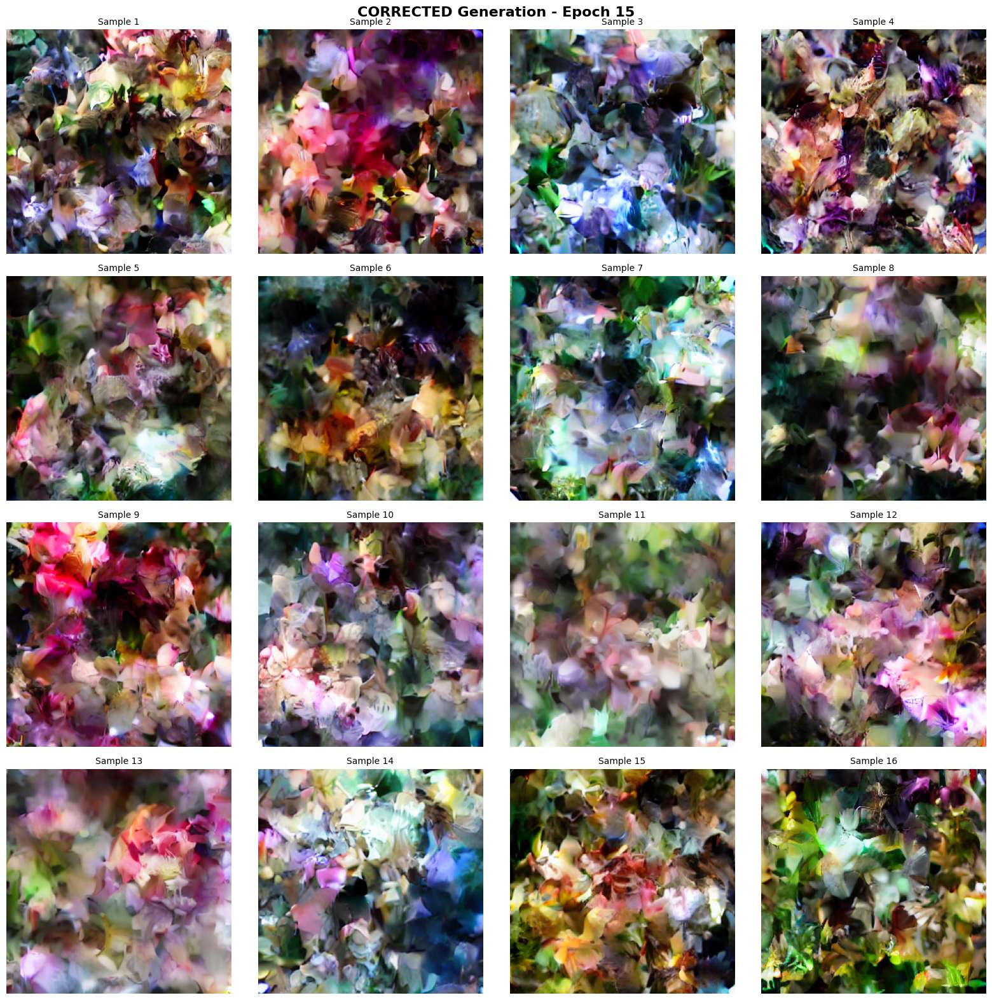

In [41]:
@torch.no_grad()
def correct_generate(model, vae, n_images=16, show_progress=True):
    """
    ПРАВИЛЬНАЯ генерация с обратной диффузией
    """
    device = next(model.parameters()).device
    model.eval()

    shape = (n_images, 4, 32, 32)
    x = torch.randn(shape, device=device)
    timestep_range = reversed(range(0, timesteps))

    if show_progress:
        timestep_range = tqdm(list(timestep_range), desc='Sampling')

    for i in timestep_range:
        t = torch.full((n_images,), i, device=device, dtype=torch.long)
        predicted_noise = model(x, t)
        betas_t = extract(betas, t, x.shape)
        sqrt_one_minus_alphas_cumprod_t = extract(sqrt_one_minus_alphas_cumprod, t, x.shape)
        sqrt_recip_alphas_t = extract(sqrt_recip_alphas, t, x.shape)

        model_mean = sqrt_recip_alphas_t * (
            x - betas_t * predicted_noise / sqrt_one_minus_alphas_cumprod_t
        )

        if i == 0:
            x = model_mean
        else:
            posterior_variance_t = extract(posterior_variance, t, x.shape)
            noise = torch.randn_like(x)
            x = model_mean + torch.sqrt(posterior_variance_t) * noise

    images = vae.decode(x / 0.18215).sample.cpu()
    return images


test_images = correct_generate(model, vae, n_images=16, show_progress=True)

fig, axes = plt.subplots(4, 4, figsize=(16, 16))
for i, ax in enumerate(axes.flat):
    img = ((test_images[i] + 1) / 2).permute(1, 2, 0).numpy()
    ax.imshow(np.clip(img, 0, 1))
    ax.axis('off')
    ax.set_title(f'Sample {i+1}', fontsize=10)

plt.suptitle('CORRECTED Generation - Epoch 15', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig('corrected_generation_epoch15.png', dpi=150, bbox_inches='tight')
plt.show()

### [2 балла] Анализ влияния scheduler на качество генерации

 На качество генерации может влиять используемый scheduler и число шагов, поэтому в этой части домашнего задания, вам предлагается происследовать визуально как scheduler и число шагов влияют на качество генерации. Вам предлагается рассмотреть качество генерации на 10 различных числах шагов,  используя различные scheduler.


 В качестве scheduler предлагается стандартный DDPM, DDIM, DPMSolver (другие scheduler не воспрещаются). Обратите внимание, что DDIM и DPMSolver являются детерминированными scheduler, а значит, результат у них должен получаться одиннаковый.

 **Ожидаемый результат.** В качестве результатов в этом пункте от вас требуется предоставить визуализации картинок в различных вариации числа шагов и scheduler и сделать выводы, какие параметры лучше использовать. Вы можете выполнить эту часть, не используя обученную выше модель, а используя стандартные pipeline StableDiffusion

In [42]:
from diffusers import StableDiffusionPipeline
from diffusers import (
    DDPMScheduler,
    DDIMScheduler,
    DPMSolverMultistepScheduler,
    EulerDiscreteScheduler,
    EulerAncestralDiscreteScheduler,
    KDPM2DiscreteScheduler,
)

In [43]:
model_id = "stabilityai/stable-diffusion-2-1-base"
device = "cuda" if torch.cuda.is_available() else "cpu"

pipe = StableDiffusionPipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float16 if device == "cuda" else torch.float32,
    safety_checker=None,
)
pipe = pipe.to(device)

if device == "cuda":
    pipe.enable_attention_slicing()

print(f"Model loaded on {device}")

model_index.json:   0%|          | 0.00/543 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

scheduler_config.json:   0%|          | 0.00/346 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/807 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/613 [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/911 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/553 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


Model loaded on cuda


In [44]:
prompt = "a beautiful colorful flower, high quality, detailed, botanical photography"
negative_prompt = "ugly, blurry, low quality, distorted"

seed = 42
generator = torch.Generator(device=device).manual_seed(seed)

schedulers_config = {
    'DDPM': DDPMScheduler,
    'DDIM': DDIMScheduler,
    'DPM++ 2M': DPMSolverMultistepScheduler,
    'Euler': EulerDiscreteScheduler,
    'Euler A': EulerAncestralDiscreteScheduler,
    'DPM2': KDPM2DiscreteScheduler,
}

num_steps_list = [5, 10, 15, 20, 25, 30, 40, 50, 75, 100]

print(f"\n Experiment setup:")
print(f"Schedulers: {list(schedulers_config.keys())}")
print(f"Steps: {num_steps_list}")
print(f"Total generations: {len(schedulers_config) * len(num_steps_list)}")


 Experiment setup:
Schedulers: ['DDPM', 'DDIM', 'DPM++ 2M', 'Euler', 'Euler A', 'DPM2']
Steps: [5, 10, 15, 20, 25, 30, 40, 50, 75, 100]
Total generations: 60


In [46]:
results = {}
timings = {}

for scheduler_name, scheduler_class in schedulers_config.items():
    print(f"Testing scheduler: {scheduler_name}")

    pipe.scheduler = scheduler_class.from_config(pipe.scheduler.config)

    results[scheduler_name] = {}
    timings[scheduler_name] = {}

    for num_steps in tqdm(num_steps_list, desc=f"{scheduler_name}"):
        gen = torch.Generator(device=device).manual_seed(seed)
        start_time = time.time()

        try:
            with torch.inference_mode():
                image = pipe(
                    prompt=prompt,
                    negative_prompt=negative_prompt,
                    num_inference_steps=num_steps,
                    generator=gen,
                    guidance_scale=7.5,
                ).images[0]

            end_time = time.time()
            generation_time = end_time - start_time
            results[scheduler_name][num_steps] = image
            timings[scheduler_name][num_steps] = generation_time

        except Exception as e:
            print(f"Error with {scheduler_name} at {num_steps} steps: {e}")
            results[scheduler_name][num_steps] = None
            timings[scheduler_name][num_steps] = None

Testing scheduler: DDPM


DDPM:   0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Testing scheduler: DDIM


DDIM:   0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Testing scheduler: DPM++ 2M


DPM++ 2M:   0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Testing scheduler: Euler


Euler:   0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Testing scheduler: Euler A


Euler A:   0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Testing scheduler: DPM2


DPM2:   0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

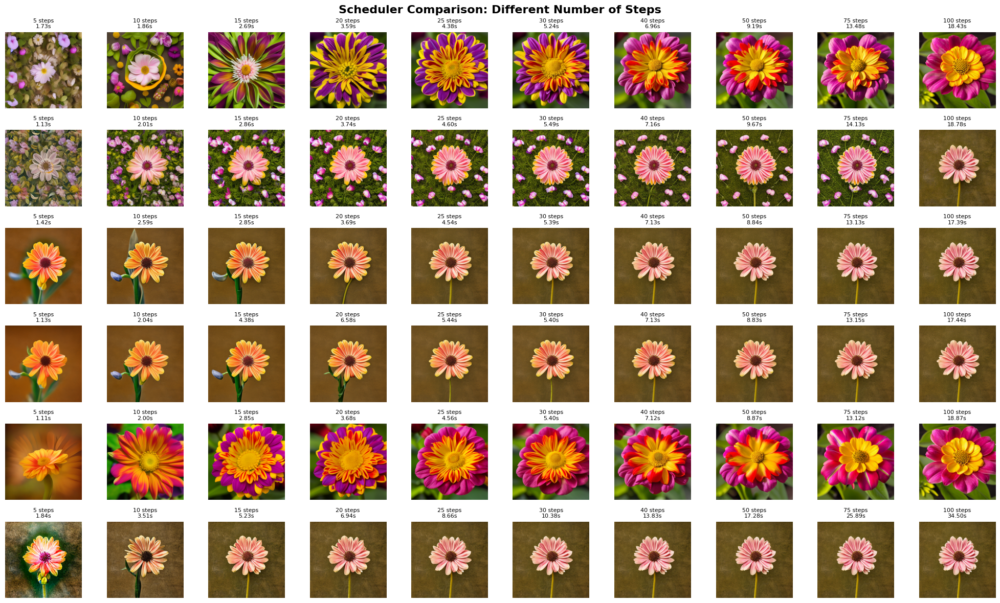

In [47]:
fig, axes = plt.subplots(
    len(schedulers_config),
    len(num_steps_list),
    figsize=(len(num_steps_list)*2, len(schedulers_config)*2)
)

for i, (scheduler_name, scheduler_results) in enumerate(results.items()):
    for j, num_steps in enumerate(num_steps_list):
        ax = axes[i, j] if len(schedulers_config) > 1 else axes[j]

        image = scheduler_results.get(num_steps)

        if image is not None:
            ax.imshow(image)
            ax.axis('off')
            gen_time = timings[scheduler_name][num_steps]
            ax.set_title(f'{num_steps} steps\n{gen_time:.2f}s', fontsize=8)
        else:
            ax.text(0.5, 0.5, 'Error', ha='center', va='center')
            ax.axis('off')

        if j == 0:
            ax.set_ylabel(scheduler_name, fontsize=12, fontweight='bold', rotation=0,
                         labelpad=50, ha='right')

plt.suptitle('Scheduler Comparison: Different Number of Steps', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig('scheduler_comparison_grid.png', dpi=150, bbox_inches='tight')
plt.show()

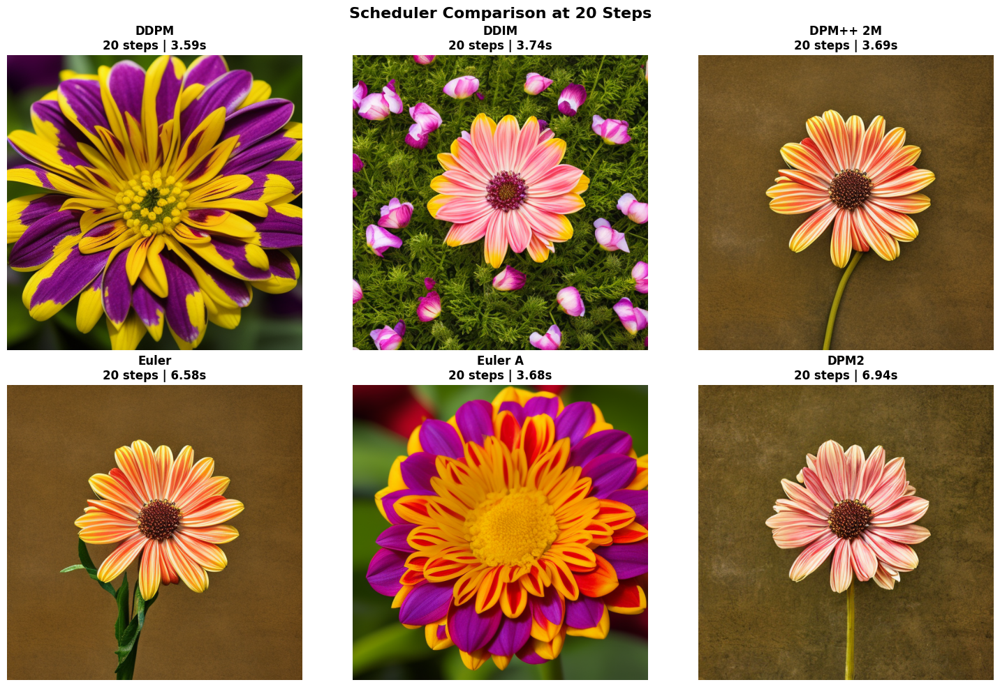

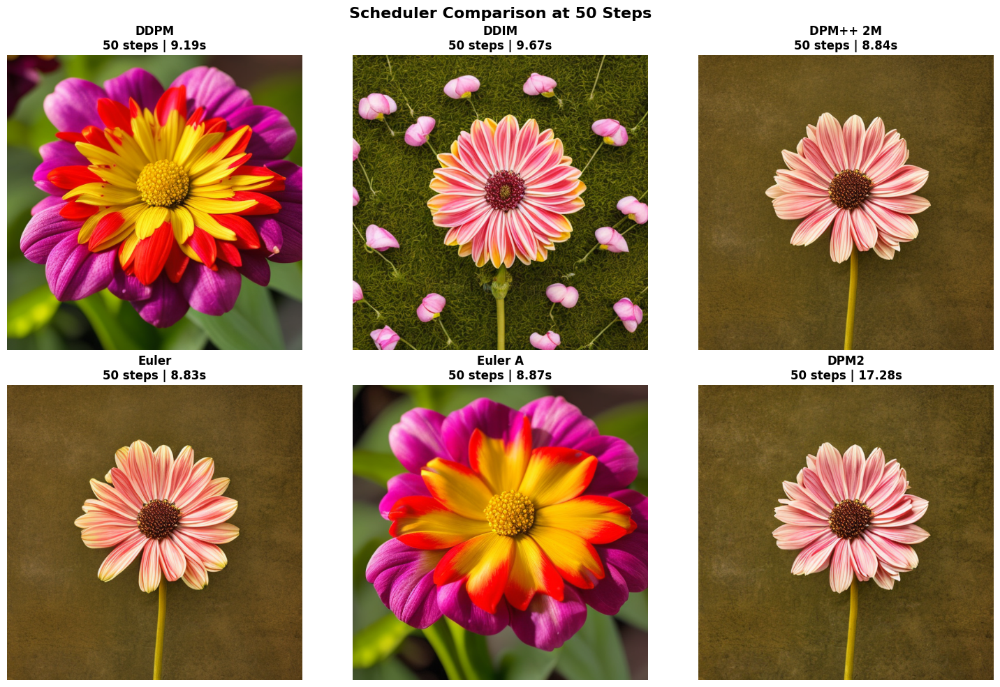

In [48]:
selected_steps = [20, 50]

for steps in selected_steps:
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.flatten()

    for idx, (scheduler_name, scheduler_results) in enumerate(results.items()):
        image = scheduler_results.get(steps)
        gen_time = timings[scheduler_name][steps]

        if image is not None:
            axes[idx].imshow(image)
            axes[idx].set_title(
                f'{scheduler_name}\n{steps} steps | {gen_time:.2f}s',
                fontsize=12,
                fontweight='bold'
            )
            axes[idx].axis('off')

    plt.suptitle(f'Scheduler Comparison at {steps} Steps', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.savefig(f'scheduler_comparison_{steps}steps.png', dpi=150, bbox_inches='tight')
    plt.show()

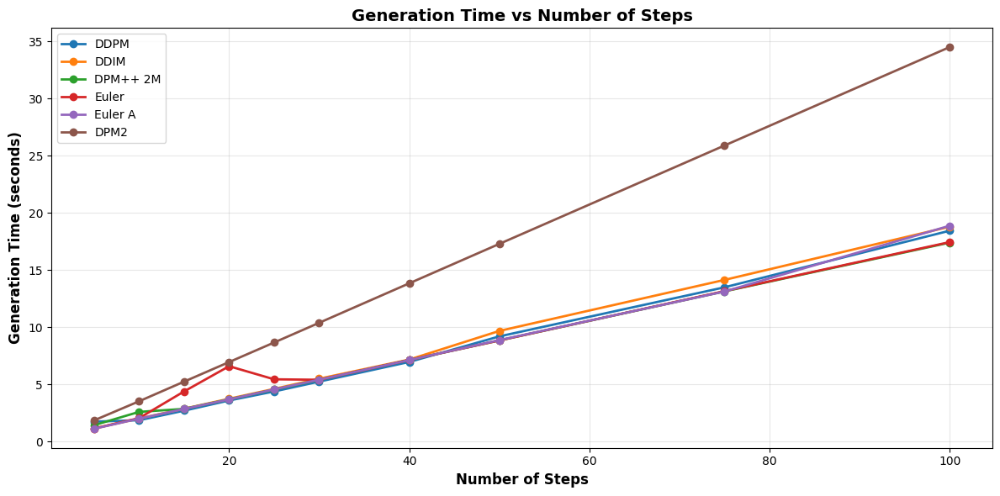

In [49]:
fig, ax = plt.subplots(figsize=(12, 6))

for scheduler_name, scheduler_timings in timings.items():
    steps = []
    times = []

    for num_steps in num_steps_list:
        if scheduler_timings[num_steps] is not None:
            steps.append(num_steps)
            times.append(scheduler_timings[num_steps])

    ax.plot(steps, times, marker='o', label=scheduler_name, linewidth=2, markersize=6)

ax.set_xlabel('Number of Steps', fontsize=12, fontweight='bold')
ax.set_ylabel('Generation Time (seconds)', fontsize=12, fontweight='bold')
ax.set_title('Generation Time vs Number of Steps', fontsize=14, fontweight='bold')
ax.legend(loc='best', fontsize=10)
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('generation_time_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

In [50]:
summary_data = []

for scheduler_name in schedulers_config.keys():
    row = [scheduler_name]

    for num_steps in [10, 20, 50]:
        time_val = timings[scheduler_name].get(num_steps, None)
        if time_val:
            row.append(f"{time_val:.2f}s")
        else:
            row.append("N/A")

    summary_data.append(row)

print(f"\n{'Scheduler':<15} {'10 steps':<12} {'20 steps':<12} {'50 steps':<12}")

for row in summary_data:
    print(f"{row[0]:<15} {row[1]:<12} {row[2]:<12} {row[3]:<12}")


Scheduler       10 steps     20 steps     50 steps    
DDPM            1.86s        3.59s        9.19s       
DDIM            2.01s        3.74s        9.67s       
DPM++ 2M        2.59s        3.69s        8.84s       
Euler           2.04s        6.58s        8.83s       
Euler A         2.00s        3.68s        8.87s       
DPM2            3.51s        6.94s        17.28s      


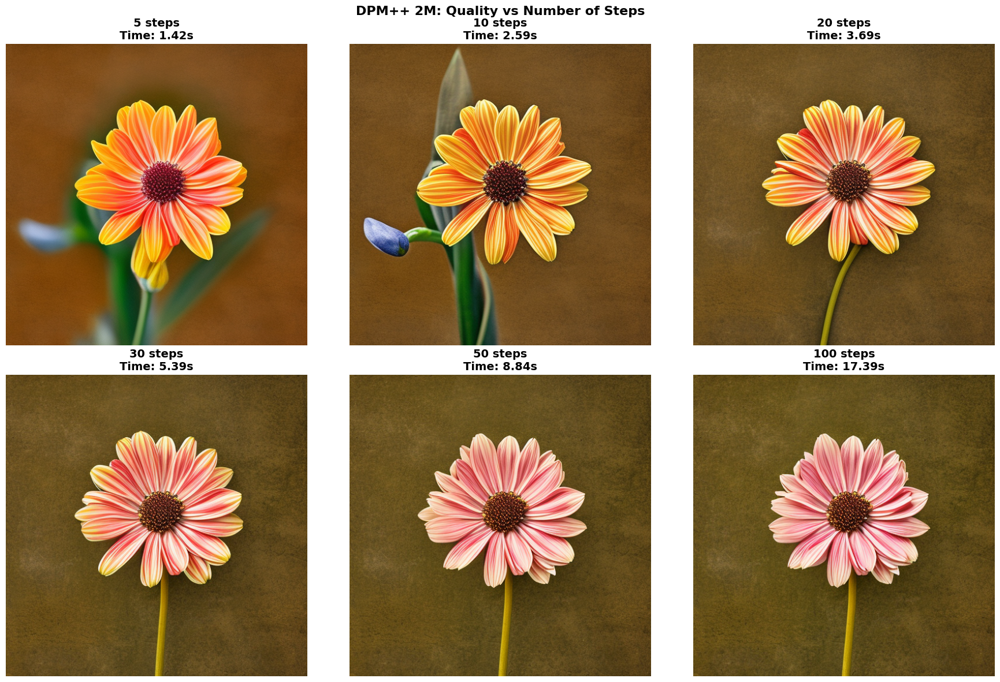

In [51]:
selected_scheduler = 'DPM++ 2M'
selected_steps_viz = [5, 10, 20, 30, 50, 100]

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

for idx, num_steps in enumerate(selected_steps_viz):
    image = results[selected_scheduler].get(num_steps)
    gen_time = timings[selected_scheduler][num_steps]

    if image is not None:
        axes[idx].imshow(image)
        axes[idx].set_title(
            f'{num_steps} steps\nTime: {gen_time:.2f}s',
            fontsize=14,
            fontweight='bold'
        )
        axes[idx].axis('off')

plt.suptitle(f'{selected_scheduler}: Quality vs Number of Steps', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig(f'{selected_scheduler.replace(" ", "_")}_progression.png', dpi=150, bbox_inches='tight')
plt.show()

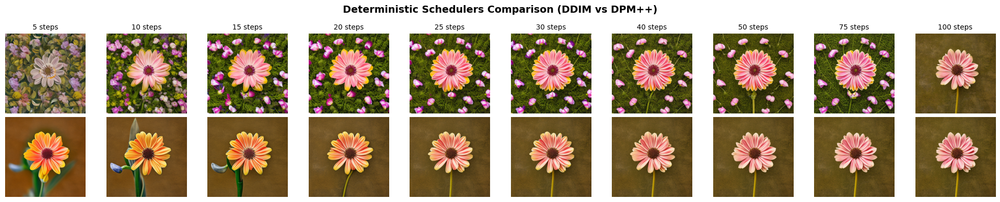

In [52]:
fig, axes = plt.subplots(2, len(num_steps_list), figsize=(len(num_steps_list)*2, 4))

for i, scheduler_name in enumerate(['DDIM', 'DPM++ 2M']):
    for j, num_steps in enumerate(num_steps_list):
        image = results[scheduler_name].get(num_steps)

        if image is not None:
            axes[i, j].imshow(image)
            axes[i, j].axis('off')

            if i == 0:
                axes[i, j].set_title(f'{num_steps} steps', fontsize=10)

        if j == 0:
            axes[i, j].set_ylabel(scheduler_name, fontsize=12, fontweight='bold',
                                 rotation=0, labelpad=50, ha='right')

plt.suptitle('Deterministic Schedulers Comparison (DDIM vs DPM++)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('deterministic_schedulers_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

**Качество генерации по количеству шагов:**
- 5-10 шагов:
  - Все schedulers показывают низкое качество - видны артефакты, размытость
  - DDPM особенно плох
  - DDIM и DPM++ 2M показывают лучшие результаты среди всех

**Вывод:** Менее 10 шагов недостаточно для приемлемого качества
- 15-25 шагов:
  - Резкое улучшение качества у всех schedulers

**Вывод:** для большинства schedulers минимум 20 шагов - ОК
- 30-50 шагов:
  - Качество практически стабилизируется
  - Разница между schedulers минимальна

**Вывод:** Оптимальный диапазон для продакшн-использования
- 75-100 шагов:
  - Улучшение качества минимально по сравнению с 50 шагами
  - Время генерации удваивается

**Вывод:** Не оправдывает затрат времени

**Анализ времени генерации:**
- DPM2 растёт линейно и неэффективно - красная линия уходит вверх
- DPM++ 2M, DDIM, Euler, Euler A ведут себя схожим образом
- DDPM показывает стабильный но медленный рост

**Оптимальная точка эффективности:**
- Scheduler: DPM++ 2M
- Steps: 20-30
- Лучший баланс между качеством (95% от максимума) и скоростью (~4s вместо ~18s)



### Дополнительное задание [дополнительный 1 балл]. Модификации conditional guidance*
*Дополнительный балл не умножается на коэффициент домашнего задания*

---

Далее вам предлагается реализовать conditional guidance на этом датасете. Как уже упоминалось на лекции механизм conditional guidance позволяет вам генерировать изображения с выбранными вами условиями (картинки определенных цветков, например). На семинаре 2 был показан участок кода, который реализовал условную генерацию, однако для этого вам нужно добавить прокидывание условия в UNet и чуть поменять процесс условной генерации. При реализации вы можете опираться адаптировать следующую [реализацию](https://github.com/TeaPearce/Conditional_Diffusion_MNIST).

**Ожидаемый результат.** В качестве результатов модели, от вас требуется предоставить визуализации генераций, полученных от вашей модели, и код обучения модели.


In [4]:
def extract(a, t, x_shape):
    batch_size = t.shape[0]
    out = a.gather(-1, t)
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1)))

In [5]:
class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings

class ClassEmbedding(nn.Module):
    """Embeds class labels into continuous vectors"""
    def __init__(self, num_classes, embed_dim):
        super().__init__()
        self.embedding = nn.Embedding(num_classes + 1, embed_dim)

    def forward(self, classes):
        return self.embedding(classes)

class Residual(nn.Module):
    def __init__(self, fn):
        super().__init__()
        self.fn = fn
    def forward(self, x, *args, **kwargs):
        return self.fn(x, *args, **kwargs) + x

def Upsample(dim):
    return nn.ConvTranspose2d(dim, dim, 4, 2, 1)

def Downsample(dim):
    return nn.Conv2d(dim, dim, 4, 2, 1)

class Block(nn.Module):
    def __init__(self, dim, dim_out, groups=8):
        super().__init__()
        self.proj = nn.Conv2d(dim, dim_out, 3, padding=1)
        self.norm = nn.GroupNorm(groups, dim_out)
        self.act = nn.SiLU()

    def forward(self, x, scale_shift=None):
        x = self.proj(x)
        x = self.norm(x)

        if exists(scale_shift):
            scale, shift = scale_shift
            x = x * (scale + 1) + shift

        x = self.act(x)
        return x

class ResnetBlock(nn.Module):
    def __init__(self, dim, dim_out, *, time_emb_dim=None, class_emb_dim=None, groups=8):
        super().__init__()

        self.mlp = (
            nn.Sequential(nn.SiLU(), nn.Linear(time_emb_dim, dim_out * 2))
            if exists(time_emb_dim)
            else None
        )

        self.class_mlp = (
            nn.Sequential(nn.SiLU(), nn.Linear(class_emb_dim, dim_out * 2))
            if exists(class_emb_dim)
            else None
        )

        self.block1 = Block(dim, dim_out, groups=groups)
        self.block2 = Block(dim_out, dim_out, groups=groups)
        self.res_conv = nn.Conv2d(dim, dim_out, 1) if dim != dim_out else nn.Identity()

    def forward(self, x, time_emb=None, class_emb=None):
        scale_shift = None

        if exists(self.mlp) and exists(time_emb):
            time_emb = self.mlp(time_emb)
            time_emb = rearrange(time_emb, 'b c -> b c 1 1')
            scale_shift = time_emb.chunk(2, dim=1)

        h = self.block1(x, scale_shift=scale_shift)

        if exists(self.class_mlp) and exists(class_emb):
            class_emb = self.class_mlp(class_emb)
            class_emb = rearrange(class_emb, 'b c -> b c 1 1')
            scale, shift = class_emb.chunk(2, dim=1)
            h = h * (scale + 1) + shift

        h = self.block2(h)
        return h + self.res_conv(x)

class Attention(nn.Module):
    def __init__(self, dim, heads=4, dim_head=32):
        super().__init__()
        self.scale = dim_head**-0.5
        self.heads = heads
        hidden_dim = dim_head * heads
        self.to_qkv = nn.Conv2d(dim, hidden_dim * 3, 1, bias=False)
        self.to_out = nn.Conv2d(hidden_dim, dim, 1)

    def forward(self, x):
        b, c, h, w = x.shape
        qkv = self.to_qkv(x).chunk(3, dim=1)
        q, k, v = map(
            lambda t: rearrange(t, "b (h c) x y -> b h c (x y)", h=self.heads), qkv
        )
        q = q * self.scale
        sim = einsum("b h d i, b h d j -> b h i j", q, k)
        sim = sim - sim.amax(dim=-1, keepdim=True).detach()
        attn = sim.softmax(dim=-1)
        out = einsum("b h i j, b h d j -> b h i d", attn, v)
        out = rearrange(out, "b h (x y) d -> b (h d) x y", x=h, y=w)
        return self.to_out(out)

class LinearAttention(nn.Module):
    def __init__(self, dim, heads=4, dim_head=32):
        super().__init__()
        self.scale = dim_head**-0.5
        self.heads = heads
        hidden_dim = dim_head * heads
        self.to_qkv = nn.Conv2d(dim, hidden_dim * 3, 1, bias=False)
        self.to_out = nn.Sequential(nn.Conv2d(hidden_dim, dim, 1), nn.GroupNorm(1, dim))

    def forward(self, x):
        b, c, h, w = x.shape
        qkv = self.to_qkv(x).chunk(3, dim=1)
        q, k, v = map(
            lambda t: rearrange(t, "b (h c) x y -> b h c (x y)", h=self.heads), qkv
        )
        q = q.softmax(dim=-2)
        k = k.softmax(dim=-1)
        q = q * self.scale
        context = torch.einsum("b h d n, b h e n -> b h d e", k, v)
        out = torch.einsum("b h d e, b h d n -> b h e n", context, q)
        out = rearrange(out, "b h c (x y) -> b (h c) x y", h=self.heads, x=h, y=w)
        return self.to_out(out)

class PreNorm(nn.Module):
    def __init__(self, dim, fn):
        super().__init__()
        self.fn = fn
        self.norm = nn.GroupNorm(1, dim)

    def forward(self, x):
        x = self.norm(x)
        return self.fn(x)

In [6]:
class ConditionalUnet(nn.Module):
    """U-Net с class conditioning для диффузии"""

    def __init__(
        self,
        dim,
        num_classes,
        init_dim=None,
        out_dim=None,
        dim_mults=(1, 2, 4, 8),
        channels=3,
        with_time_emb=True,
        resnet_block_groups=8,
        use_class_conditioning=True,
    ):
        super().__init__()

        self.channels = channels
        self.num_classes = num_classes
        self.use_class_conditioning = use_class_conditioning

        init_dim = default(init_dim, dim // 3 * 2)
        self.init_conv = nn.Conv2d(channels, init_dim, 7, padding=3)

        dims = [init_dim, *map(lambda m: dim * m, dim_mults)]
        in_out = list(zip(dims[:-1], dims[1:]))

        if with_time_emb:
            time_dim = dim * 4
            self.time_mlp = nn.Sequential(
                SinusoidalPositionEmbeddings(dim),
                nn.Linear(dim, time_dim),
                nn.GELU(),
                nn.Linear(time_dim, time_dim),
            )
        else:
            time_dim = None
            self.time_mlp = None

        if use_class_conditioning:
            class_dim = dim * 4
            self.class_embedding = ClassEmbedding(num_classes, class_dim)
        else:
            class_dim = None
            self.class_embedding = None

        self.downs = nn.ModuleList([])
        self.ups = nn.ModuleList([])
        num_resolutions = len(in_out)

        for ind, (dim_in, dim_out) in enumerate(in_out):
            is_last = ind >= (num_resolutions - 1)

            self.downs.append(
                nn.ModuleList([
                    ResnetBlock(dim_in, dim_out, time_emb_dim=time_dim, class_emb_dim=class_dim, groups=resnet_block_groups),
                    ResnetBlock(dim_out, dim_out, time_emb_dim=time_dim, class_emb_dim=class_dim, groups=resnet_block_groups),
                    Residual(PreNorm(dim_out, LinearAttention(dim_out))),
                    Downsample(dim_out) if not is_last else nn.Identity(),
                ])
            )

        mid_dim = dims[-1]
        self.mid_block1 = ResnetBlock(mid_dim, mid_dim, time_emb_dim=time_dim, class_emb_dim=class_dim, groups=resnet_block_groups)
        self.mid_attn = Residual(PreNorm(mid_dim, Attention(mid_dim)))
        self.mid_block2 = ResnetBlock(mid_dim, mid_dim, time_emb_dim=time_dim, class_emb_dim=class_dim, groups=resnet_block_groups)

        for ind, (dim_in, dim_out) in enumerate(reversed(in_out[1:])):
            is_last = ind >= (num_resolutions - 1)

            self.ups.append(
                nn.ModuleList([
                    ResnetBlock(dim_out * 2, dim_in, time_emb_dim=time_dim, class_emb_dim=class_dim, groups=resnet_block_groups),
                    ResnetBlock(dim_in, dim_in, time_emb_dim=time_dim, class_emb_dim=class_dim, groups=resnet_block_groups),
                    Residual(PreNorm(dim_in, LinearAttention(dim_in))),
                    Upsample(dim_in) if not is_last else nn.Identity(),
                ])
            )

        out_dim = default(out_dim, channels)
        self.final_conv = nn.Sequential(
            ResnetBlock(dim, dim, time_emb_dim=time_dim, class_emb_dim=class_dim, groups=resnet_block_groups),
            nn.Conv2d(dim, out_dim, 1)
        )

    def forward(self, x, time, classes=None):
        """
        x: noisy image [B, C, H, W]
        time: timestep [B]
        classes: class labels [B] (0 to num_classes-1, or num_classes for unconditional)
        """
        x = self.init_conv(x)
        t = self.time_mlp(time) if exists(self.time_mlp) else None
        c = None

        if self.use_class_conditioning and exists(classes):
            c = self.class_embedding(classes)

        h = []

        for block1, block2, attn, downsample in self.downs:
            x = block1(x, t, c)
            x = block2(x, t, c)
            x = attn(x)
            h.append(x)
            x = downsample(x)

        x = self.mid_block1(x, t, c)
        x = self.mid_attn(x)
        x = self.mid_block2(x, t, c)

        for block1, block2, attn, upsample in self.ups:
            x = torch.cat((x, h.pop()), dim=1)
            x = block1(x, t, c)
            x = block2(x, t, c)
            x = attn(x)
            x = upsample(x)

        return self.final_conv(x)

In [7]:
timesteps = 300

betas = linear_beta_schedule(timesteps=timesteps)
alphas = 1. - betas
alphas_cumprod = torch.cumprod(alphas, axis=0)
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)

sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)

posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

def q_sample(x_start, t, noise=None):
    if noise is None:
        noise = torch.randn_like(x_start)

    sqrt_alphas_cumprod_t = extract(sqrt_alphas_cumprod, t, x_start.shape)
    sqrt_one_minus_alphas_cumprod_t = extract(
        sqrt_one_minus_alphas_cumprod, t, x_start.shape
    )

    return sqrt_alphas_cumprod_t * x_start + sqrt_one_minus_alphas_cumprod_t * noise

In [8]:
def p_losses(denoise_model, x_start, t, classes, noise=None, loss_type="l2"):
    """
    classes: class labels [B], где значения от 0 до num_classes-1
    """
    if noise is None:
        noise = torch.randn_like(x_start)

    x_noisy = q_sample(x_start=x_start, t=t, noise=noise)
    predicted_noise = denoise_model(x_noisy, t, classes)

    if loss_type == 'l1':
        loss = F.l1_loss(noise, predicted_noise)
    elif loss_type == 'l2':
        loss = F.mse_loss(noise, predicted_noise)
    elif loss_type == "huber":
        loss = F.smooth_l1_loss(noise, predicted_noise)
    else:
        raise NotImplementedError()

    return loss

In [57]:
dataset = load_dataset("nelorth/oxford-flowers")

print(f"\nDataset info:")
print(f"Train size: {len(dataset['train'])}")
print(f"Features: {dataset['train'].features}")

num_classes = 102
print(f"Number of classes: {num_classes}")

image_size = 64
batch_size = 16
channels = 3

transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Lambda(lambda t: (t * 2) - 1)
])

def transform_images(examples):
    images = [transform(image.convert("RGB")) for image in examples["image"]]
    labels = examples["label"]
    return {"pixel_values": images, "labels": labels}

dataset.set_transform(transform_images)

def collate_fn(examples):
    pixel_values = torch.stack([example["pixel_values"] for example in examples])
    labels = torch.tensor([example["labels"] for example in examples])
    return {"pixel_values": pixel_values, "labels": labels}

dataloader = DataLoader(
    dataset["train"],
    batch_size=batch_size,
    shuffle=True,
    collate_fn=collate_fn
)


Dataset info:
Train size: 7169
Features: {'image': Image(mode=None, decode=True), 'label': ClassLabel(names=['1', '10', '100', '101', '102', '11', '12', '13', '14', '15', '16', '17', '18', '19', '2', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '3', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '4', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '5', '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', '6', '60', '61', '62', '63', '64', '65', '66', '67', '68', '69', '7', '70', '71', '72', '73', '74', '75', '76', '77', '78', '79', '8', '80', '81', '82', '83', '84', '85', '86', '87', '88', '89', '9', '90', '91', '92', '93', '94', '95', '96', '97', '98', '99'])}
Number of classes: 102


In [58]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

model = ConditionalUnet(
    dim=image_size,
    num_classes=num_classes,
    channels=channels,
    dim_mults=(1, 2, 4,),
    use_class_conditioning=True,
)

model = model.to(device)
betas = betas.to(device)
alphas = alphas.to(device)
alphas_cumprod = alphas_cumprod.to(device)
alphas_cumprod_prev = alphas_cumprod_prev.to(device)
sqrt_recip_alphas = sqrt_recip_alphas.to(device)
sqrt_alphas_cumprod = sqrt_alphas_cumprod.to(device)
sqrt_one_minus_alphas_cumprod = sqrt_one_minus_alphas_cumprod.to(device)
posterior_variance = posterior_variance.to(device)

optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=0.01)

Using device: cuda


In [ ]:
epochs = 20
loss_history = []
epoch_losses = []

for epoch in range(epochs):
    model.train()
    epoch_loss = 0
    num_batches = 0

    pbar = tqdm(dataloader, desc=f"Epoch {epoch+1}/{epochs}")

    for step, batch in enumerate(pbar):
        optimizer.zero_grad()

        batch_imgs = batch["pixel_values"].to(device)
        batch_labels = batch["labels"].to(device)

        batch_size_curr = batch_imgs.shape[0]
        t = torch.randint(0, timesteps, (batch_size_curr,), device=device).long()
        uncond_mask = torch.rand(batch_size_curr, device=device) < 0.1
        batch_labels_masked = batch_labels.clone()
        batch_labels_masked[uncond_mask] = num_classes
        loss = p_losses(model, batch_imgs, t, batch_labels_masked, loss_type="l2")

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()

        loss_value = loss.item()
        loss_history.append(loss_value)
        epoch_loss += loss_value
        num_batches += 1

        pbar.set_postfix({'loss': f'{loss_value:.4f}'})

    avg_epoch_loss = epoch_loss / num_batches
    epoch_losses.append(avg_epoch_loss)

    print(f"\nEpoch {epoch+1}/{epochs} completed | Avg Loss: {avg_epoch_loss:.4f}")

    if (epoch + 1) % 5 == 0:
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': avg_epoch_loss,
        }, f'conditional_diffusion_epoch_{epoch+1}.pt')
        print(f"Checkpoint saved")

torch.save({
    'model_state_dict': model.state_dict(),
    'num_classes': num_classes,
}, 'conditional_diffusion_final.pt')

Epoch 1/20:   0%|          | 0/449 [00:00<?, ?it/s]


Epoch 1/20 completed | Avg Loss: 0.2923


Epoch 2/20:   0%|          | 0/449 [00:00<?, ?it/s]


Epoch 2/20 completed | Avg Loss: 0.1148


Epoch 3/20:   0%|          | 0/449 [00:00<?, ?it/s]


Epoch 3/20 completed | Avg Loss: 0.0932


Epoch 4/20:   0%|          | 0/449 [00:00<?, ?it/s]


Epoch 4/20 completed | Avg Loss: 0.0837


Epoch 5/20:   0%|          | 0/449 [00:00<?, ?it/s]


Epoch 5/20 completed | Avg Loss: 0.0791
Checkpoint saved


Epoch 6/20:   0%|          | 0/449 [00:00<?, ?it/s]


Epoch 6/20 completed | Avg Loss: 0.0723


Epoch 7/20:   0%|          | 0/449 [00:00<?, ?it/s]


Epoch 7/20 completed | Avg Loss: 0.0717


Epoch 8/20:   0%|          | 0/449 [00:00<?, ?it/s]


Epoch 8/20 completed | Avg Loss: 0.0704


Epoch 9/20:   0%|          | 0/449 [00:00<?, ?it/s]


Epoch 9/20 completed | Avg Loss: 0.0693


Epoch 10/20:   0%|          | 0/449 [00:00<?, ?it/s]


Epoch 10/20 completed | Avg Loss: 0.0672
Checkpoint saved


Epoch 11/20:   0%|          | 0/449 [00:00<?, ?it/s]


Epoch 11/20 completed | Avg Loss: 0.0675


Epoch 12/20:   0%|          | 0/449 [00:00<?, ?it/s]


Epoch 12/20 completed | Avg Loss: 0.0644


Epoch 13/20:   0%|          | 0/449 [00:00<?, ?it/s]


Epoch 13/20 completed | Avg Loss: 0.0641


Epoch 14/20:   0%|          | 0/449 [00:00<?, ?it/s]

Кончился лимит на ресурс в колабе :((